# **Text Summarization using a LSTM network**

We will start of simple by implementing a LSTM Recurrent Neural Network on our summarization task.

Due to resource constraints, we will only be utilising around 70000 reviews.



In [1]:
from google.colab import files
uploaded = files.upload()

Saving reviews_clean5.csv to reviews_clean5.csv


In [2]:
import pandas as pd
import numpy as np
pd.set_option("display.max_colwidth", -1)

df = pd.read_csv('reviews_clean5.csv',nrows=70000)#
df.head()

<ipython-input-2-11aae8d68579>:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option("display.max_colwidth", -1)


,Unnamed: 0,Id,Summary,Text
0,0,1,good quality dog food,i have bought several of the vitality canned dog food products and have found them all to be of good quality the product looks more like a stew than a processed meat and it smells better my labrador is finicky and she appreciates this product better than most
1,1,2,not as advertised,product arrived labeled as jumbo salted peanutsthe peanuts were actually small sized unsalted not sure if this was an error or if the vendor intended to represent the product as jumbo
2,2,3,delight says it all,this is a confection that has been around a few centuries it is a light pillowy citrus gelatin with nuts in this case filberts and it is cut into tiny squares and then liberally coated with powdered sugar and it is a tiny mouthful of heaven not too chewy and very flavorful i highly recommend this yummy treat if you are familiar with the story of cs lewis the lion the witch and the wardrobe this is the treat that seduces edmund into selling out his brother and sisters to the witch
3,3,4,cough medicine,if you are looking for the secret ingredient in robitussin i believe i have found it i got this in addition to the root beer extract i ordered and made some cherry soda the flavor is very medicinal
4,4,5,great taffy,great taffy at a great price there was a wide assortment of yummy taffy delivery was very quick if your a taffy lover this is a deal


In [3]:
df[df.duplicated()]


,Unnamed: 0,Id,Summary,Text


Let's proceed to remove duplicate rows and drop rows containing NaNs.

In [4]:
df.drop_duplicates(subset=['Text'], inplace=True)
df.dropna(axis=0,inplace=True)
df.replace('',np.nan,inplace=True)

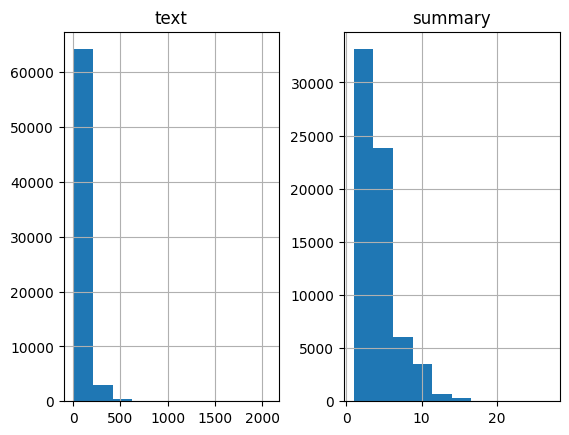

In [5]:
import matplotlib.pyplot as plt

text_word_count = []
summary_word_count = []

# populate the lists with sentence lengths
for i in df['Text']:
      text_word_count.append(len(i.split()))

for i in df['Summary']:
      summary_word_count.append(len(i.split()))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})

length_df.hist(bins = 10)
plt.show()

From the plots above, we see that majority of texts and summaries lies below 100 and 10 words respectively. We can leverage this by setting a maximum text and summary length for padding purposes later!

In [6]:
max_text_len=150
max_summary_len=10

In [7]:
cleaned_text =np.array(df['Text'])
cleaned_summary=np.array(df['Summary'])

short_text=[]
short_summary=[]

for i in range(len(cleaned_text)):
    if(len(cleaned_summary[i].split())<=max_summary_len and len(cleaned_text[i].split())<=max_text_len):
        short_text.append(cleaned_text[i])
        short_summary.append(cleaned_summary[i])

df=pd.DataFrame({'text':short_text,'summary':short_summary})

In [8]:
df

,text,summary
0,i have bought several of the vitality canned dog food products and have found them all to be of good quality the product looks more like a stew than a processed meat and it smells better my labrador is finicky and she appreciates this product better than most,good quality dog food
1,product arrived labeled as jumbo salted peanutsthe peanuts were actually small sized unsalted not sure if this was an error or if the vendor intended to represent the product as jumbo,not as advertised
2,this is a confection that has been around a few centuries it is a light pillowy citrus gelatin with nuts in this case filberts and it is cut into tiny squares and then liberally coated with powdered sugar and it is a tiny mouthful of heaven not too chewy and very flavorful i highly recommend this yummy treat if you are familiar with the story of cs lewis the lion the witch and the wardrobe this is the treat that seduces edmund into selling out his brother and sisters to the witch,delight says it all
3,if you are looking for the secret ingredient in robitussin i believe i have found it i got this in addition to the root beer extract i ordered and made some cherry soda the flavor is very medicinal,cough medicine
4,great taffy at a great price there was a wide assortment of yummy taffy delivery was very quick if your a taffy lover this is a deal,great taffy
...,...,...
58809,this brand not only lives up to its name but it also brews very well there is no bitter after taste and it leaves one feeling very satisfied only after one cup,rich but very satisfying
58810,for years i have been a huge starbucks coffee lover devoted infact but i was out of coffee and the small grocery store i went to did not carry starbucks so i debated what to get and grab this brand i waited a few days to try it i was sceptic but now i am in love with gevalia coffee and will probably buy it from now onit is smooth tasteful and beyond heaven,the best
58811,this gevalia one of my favorites coffee good flavor and aroma and good price hope that it had more aroma but still great,favorite coffee
58812,i really like gevalia colombian roast it has so rich aroma and great taste one of my favorite drink it several times a day,great coffee


In [9]:
def remove_short(text):
  tokens = text.split()
  longs = []
  for i in tokens:
     if len(i)>1:
        longs.append(i)
  return (" ".join(longs))

clean_summary = []
for t in df['summary']:
   clean_summary.append(remove_short(t))



In [10]:
df['summary'] = clean_summary

In [11]:
df = df[df['summary'].str.len()>=2]
df.head()

,text,summary
0,i have bought several of the vitality canned dog food products and have found them all to be of good quality the product looks more like a stew than a processed meat and it smells better my labrador is finicky and she appreciates this product better than most,good quality dog food
1,product arrived labeled as jumbo salted peanutsthe peanuts were actually small sized unsalted not sure if this was an error or if the vendor intended to represent the product as jumbo,not as advertised
2,this is a confection that has been around a few centuries it is a light pillowy citrus gelatin with nuts in this case filberts and it is cut into tiny squares and then liberally coated with powdered sugar and it is a tiny mouthful of heaven not too chewy and very flavorful i highly recommend this yummy treat if you are familiar with the story of cs lewis the lion the witch and the wardrobe this is the treat that seduces edmund into selling out his brother and sisters to the witch,delight says it all
3,if you are looking for the secret ingredient in robitussin i believe i have found it i got this in addition to the root beer extract i ordered and made some cherry soda the flavor is very medicinal,cough medicine
4,great taffy at a great price there was a wide assortment of yummy taffy delivery was very quick if your a taffy lover this is a deal,great taffy


In [12]:
from nltk.tokenize import sent_tokenize, word_tokenize
import gensim
from gensim.models import Word2Vec


In [13]:
def build_corpus(data, column):
    corpus = []
    for col in [column]:
        for sent in data[col].iteritems():
            print(sent)
            word_list = sent[1].split(" ")
            corpus.append(word_list)

    return corpus

corpus_text = build_corpus(df,'text')
corpus_text

<ipython-input-13-da62ce56f74a>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for sent in data[col].iteritems():


Streaming output truncated to the last 5000 lines.
(2928, 'a  good  cup  of  hot  chocolatewith  a couple  of  marshmellows make  it  for  my  daughter  every  time  she  visits she  is  nearly  60 and  she  loves  it')
(2929, 'all  three  flavors  have  a nice  aroma  and  rich  chocolate  taste peppermint  is  our  favorite we  enjoy  a cup  after  dinner flavored with  a bit  of  creme  liquor  nearly  every  night it  is  become  a tasty  habit')
(2930, 'this  item  had  a great  price  and  tastes  great the  only  thing  that  could  make  this  product  better  is  if  the  little  plastic  cup  was  recyclable  or  compostable')
(2931, 'my  husband  and  i really  like  this  cocoa i  add  extra  milk  to  my  cup  for  a creamier  flavor but  the  convenience  cannot  be  beat')
(2932, 'great  deal especially  for  the  price item  arrived  quicker  than  anticipated this  has  saved  me  many  trips  to  dunkin  doniuts  as  well  as  saving  me  paying  double  the  price  f

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(14447, 'yum yum i  cannot  keep  away  from  this  stuff i can  down  a whole  box  in  one  sitting thankfully amazon  sells  this  stuff  in  boxes  of  10 i will  be  customer  of  scooby  doo  for  a long  time  to  come note it  would  have  rated  5 stars  had  it  less  sodium  and  was  not  man made  processed  snack  food')
(14448, 'scooby  snacks  and  fruit  gushers  are  my  favorite  two  fruit  snacks the  greens  and  blues  are  so  awesome my  roomate  and  i go  through  these  a box  at  a time the  vitamin  c will  help  your  immune  system and  they  contain  no  fat sugar  content  could  be  a concern  for  some  but  not  me these  also  contain  a minor  amount  of  pectin a  common  ingredient  in  throat  lozenges somewhat  helpful  combined  with  the  vitamin  c if  you  have  got  a cold sore  throat')
(14449, 'he  likes  to  see  which  character  is  on  his  fruit  snack betty  crocker  fruit  snacks

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(26817, 'very  tasty  syrup  organic  too grade  b is  less  processed  and  should  have  more  maple  flavor  than  grade  a syrups i  am  knocking  a star  off  because  of  the  high  price  which  reduces  its  value but  sometimes  there  are  sales  and  coupons  that  make  it  a much  better  buy if  price  were  no  object then  i would  give  it  5 stars much  better  than  pouring  high  fructose  corn  syrup  with  artificial  flavors  on  your  pancakes  and  waffles')
(26818, 'this  was  a bit  smaller  than  i was  thinking very  sweet still  very  good  though but  for  the  price i  should  expect  a bit  more  for 22 i  would  think 15  would  be  fair  for  this  size')
(26819, 'it  is  not  as  sweet  as  i thought  it  would  be  for  a grade  b syrup  but  good  maple  flavor  and  dark  amber  color i  got  two  jugs one  for  me  and  one  for  a gift')
(26820, 'wish  there  is  an  option  for  a bottle  from 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(36693, 'this  product  is  as  good  as  the  ones  bought  in  the  store  with  about  a year  expiration  date  on  the  lid i  would  order  again')
(36694, 'is  a good  product  and  can  be  used  for  many  different  dishes makes  a good  quick  sauce  for  busy  week  nights')
(36695, 'not  as  many  chunks  as  i would  have  thought  but  i am  still  very  satisfied not  only  is  it  good  on  pasta  but  it  makes  a fine  pizza  sauce  too the  garlic  and  onion  flavors  are  present  but  not  overpowering  at  all')
(36696, 'with  high  grocery  prices  in  my  area  i am  always  on  the  search  for  a deal  and  this  has  to  be  one  of  the  best  deals  i have  ever  found  on  amazon the  jars  are  larger  than  the  normal  grocery  size  so  they  really  last the  jars  are  plastic  and  they  double  box so  they  were  in  perfect  shape  when  delivered with  the  subscribe  and  save  option  it  is

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(48191, 'not  too  many  good  brands  of  dry  milk  out  there this  is  good works  well  in  smoothies  and  home made  yogurt')
(48192, 'i  am  a very  picky  person  when  it  comes  to  non fat  dry  milk i  specifically  ordered  this  product  for  a dry  cocoa  mix  or  hot  chocolate  mix  i was  making  for  friends  during  the  holidays this  organic  valley  non fat  dry  milk  makes  it  taste  just  like  milk my  mix  turned  out  perfect  tastes  just  like  carnation  or  swiss  miss  hot  chocolate  mix  when  you  add  water  to  it thanks  for  offering  this  product')
(48193, 'this  is  unlike  any  dry  milk  i have  ever  used it  is  a super  fine  texture so  that  when  i add  it  to  something  it  turns  into  glue i  have  always  used  dry  milk  in  my  coffee unlike  half  and  half  it  does  not  go  bad and  unlike  instant  creamer  it  is  not  artificial but  this  stuff  is  terrible i  wish  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(57544, 'i  recently  ordered  the  breakfast  cookies  and  find  them  rather  unpleasant  to  eat perhaps  if  i were  in  a situation  where  that  is  the  only  thing  i had  to  eat  it  would  not  be  quite  so  bad i  do  not  know')
(57545, ' i  love  having  these  cookies  for  breakfast  or  as  a snack they  keep  me  feeling  full  for  hours and  give  me  lots  of  energy i  feel  good  about  eatting  them  since  they  are  so  healthy  and  yummy')
(57546, 'i  love  this  new  16  pack the  value  is  great much much  cheaper  than  buying  from  the  actual  company i  definitely  will  be  buying  more  and  hope  i can  get  just  the  chocolate  this  way  next  time')
(57547, 'these  are  really  good i  am  becoming  addicted and  the  warehouse  price  is  quite  lower  than  ss  even i  like  the  fact  that  they  are  good  for  you  and  and  that  a great  side  effect  is  that  those  who  must  take  opioids  for  pain  get  intestinal  relief no  w

[['i',
  '',
  'have',
  '',
  'bought',
  '',
  'several',
  '',
  'of',
  '',
  'the',
  '',
  'vitality',
  '',
  'canned',
  '',
  'dog',
  '',
  'food',
  '',
  'products',
  '',
  'and',
  '',
  'have',
  '',
  'found',
  '',
  'them',
  '',
  'all',
  '',
  'to',
  '',
  'be',
  '',
  'of',
  '',
  'good',
  '',
  'quality',
  'the',
  '',
  'product',
  '',
  'looks',
  '',
  'more',
  '',
  'like',
  '',
  'a',
  'stew',
  '',
  'than',
  '',
  'a',
  'processed',
  '',
  'meat',
  '',
  'and',
  '',
  'it',
  '',
  'smells',
  '',
  'better',
  'my',
  '',
  'labrador',
  '',
  'is',
  '',
  'finicky',
  '',
  'and',
  '',
  'she',
  '',
  'appreciates',
  '',
  'this',
  '',
  'product',
  '',
  'better',
  '',
  'than',
  '',
  'most'],
 ['product',
  '',
  'arrived',
  '',
  'labeled',
  '',
  'as',
  '',
  'jumbo',
  '',
  'salted',
  '',
  'peanutsthe',
  '',
  'peanuts',
  '',
  'were',
  '',
  'actually',
  '',
  'small',
  '',
  'sized',
  '',
  'unsalted',
  'not',
 

In [ ]:
from nltk.tokenize import sent_tokenize, word_tokenize
import gensim
from gensim.models import Word2Vec

In [14]:
model_text = gensim.models.Word2Vec(corpus_text,min_count=2,vector_size=100,window=2,sg=1)

There are several reasons why we add start and end tokens to each of our training summaries prior to training. They are essential in guiding the model's behavior, playing a crucial role in achieving accurate and coherent Seq2Seq generation in encoder-decoder models.

1. **Training signal**: These tokens provide clear signals to the model about the beginning and end of the target sequence during training. This helps the model to understand the desired output length and structure, faciliating more effective learning

2. **Input-Output Alignment**: The start token aligns with the final hidden state of the encoder, allowing the decoder to have access to a fixed initial context representing the input sequence before generating the first token of the output. This ensures coherence between the input and output during generation.

3. **Inference and Decoding**: During inference, when we use the trained model to generate summaries for new text, the start token is used as the first input to the decoder, initializing the decoding process. Similarly, the end token is used to determine the stopping criterion for the model to finish generating the summary.

Other reasons include handling variable length output and having special token representation.

In [15]:
df['summary'] = df['summary'].apply(lambda x : 'SOSTOKEN '+ str(x) + ' ENDTOKEN')
df

<ipython-input-15-a777a0453b0b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['summary'] = df['summary'].apply(lambda x : 'SOSTOKEN '+ str(x) + ' ENDTOKEN')


,text,summary
0,i have bought several of the vitality canned dog food products and have found them all to be of good quality the product looks more like a stew than a processed meat and it smells better my labrador is finicky and she appreciates this product better than most,SOSTOKEN good quality dog food ENDTOKEN
1,product arrived labeled as jumbo salted peanutsthe peanuts were actually small sized unsalted not sure if this was an error or if the vendor intended to represent the product as jumbo,SOSTOKEN not as advertised ENDTOKEN
2,this is a confection that has been around a few centuries it is a light pillowy citrus gelatin with nuts in this case filberts and it is cut into tiny squares and then liberally coated with powdered sugar and it is a tiny mouthful of heaven not too chewy and very flavorful i highly recommend this yummy treat if you are familiar with the story of cs lewis the lion the witch and the wardrobe this is the treat that seduces edmund into selling out his brother and sisters to the witch,SOSTOKEN delight says it all ENDTOKEN
3,if you are looking for the secret ingredient in robitussin i believe i have found it i got this in addition to the root beer extract i ordered and made some cherry soda the flavor is very medicinal,SOSTOKEN cough medicine ENDTOKEN
4,great taffy at a great price there was a wide assortment of yummy taffy delivery was very quick if your a taffy lover this is a deal,SOSTOKEN great taffy ENDTOKEN
...,...,...
58809,this brand not only lives up to its name but it also brews very well there is no bitter after taste and it leaves one feeling very satisfied only after one cup,SOSTOKEN rich but very satisfying ENDTOKEN
58810,for years i have been a huge starbucks coffee lover devoted infact but i was out of coffee and the small grocery store i went to did not carry starbucks so i debated what to get and grab this brand i waited a few days to try it i was sceptic but now i am in love with gevalia coffee and will probably buy it from now onit is smooth tasteful and beyond heaven,SOSTOKEN the best ENDTOKEN
58811,this gevalia one of my favorites coffee good flavor and aroma and good price hope that it had more aroma but still great,SOSTOKEN favorite coffee ENDTOKEN
58812,i really like gevalia colombian roast it has so rich aroma and great taste one of my favorite drink it several times a day,SOSTOKEN great coffee ENDTOKEN


In [16]:
corpus_summary = build_corpus(df,'summary')
corpus_summary

<ipython-input-13-da62ce56f74a>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for sent in data[col].iteritems():


Streaming output truncated to the last 5000 lines.
(53813, 'SOSTOKEN not freshly roasted ENDTOKEN')
(53814, 'SOSTOKEN excellent truly ENDTOKEN')
(53815, 'SOSTOKEN rich indulgent kenya aa whole bean coffee ENDTOKEN')
(53816, 'SOSTOKEN love coffee bean direct beans ENDTOKEN')
(53817, 'SOSTOKEN tasty coffee ENDTOKEN')
(53818, 'SOSTOKEN great coffee ENDTOKEN')
(53819, 'SOSTOKEN great and flavorful coffee ENDTOKEN')
(53820, 'SOSTOKEN okay but ENDTOKEN')
(53821, 'SOSTOKEN very very good ENDTOKEN')
(53822, 'SOSTOKEN good coffee at good price ENDTOKEN')
(53823, 'SOSTOKEN best fish rub ever ENDTOKEN')
(53824, 'SOSTOKEN wow great coffee ENDTOKEN')
(53825, 'SOSTOKEN delicious ENDTOKEN')
(53826, 'SOSTOKEN salsa lovers need to try this flavor ENDTOKEN')
(53827, 'SOSTOKEN stale ENDTOKEN')
(53828, 'SOSTOKEN nice taste but where is my cracker ENDTOKEN')
(53829, 'SOSTOKEN perfect ENDTOKEN')
(53830, 'SOSTOKEN this is my new favorite gum ENDTOKEN')
(53831, 'SOSTOKEN bliss ENDTOKEN')
(53832, 'SOSTOKEN ver

[['SOSTOKEN', 'good', 'quality', 'dog', 'food', 'ENDTOKEN'],
 ['SOSTOKEN', 'not', 'as', 'advertised', 'ENDTOKEN'],
 ['SOSTOKEN', 'delight', 'says', 'it', 'all', 'ENDTOKEN'],
 ['SOSTOKEN', 'cough', 'medicine', 'ENDTOKEN'],
 ['SOSTOKEN', 'great', 'taffy', 'ENDTOKEN'],
 ['SOSTOKEN', 'nice', 'taffy', 'ENDTOKEN'],
 ['SOSTOKEN',
  'great',
  'just',
  'as',
  'good',
  'as',
  'the',
  'expensive',
  'brands',
  'ENDTOKEN'],
 ['SOSTOKEN', 'wonderful', 'tasty', 'taffy', 'ENDTOKEN'],
 ['SOSTOKEN', 'yay', 'barley', 'ENDTOKEN'],
 ['SOSTOKEN', 'healthy', 'dog', 'food', 'ENDTOKEN'],
 ['SOSTOKEN', 'the', 'best', 'hot', 'sauce', 'in', 'the', 'world', 'ENDTOKEN'],
 ['SOSTOKEN',
  'my',
  'cats',
  'are',
  'not',
  'fans',
  'of',
  'the',
  'new',
  'food',
  'ENDTOKEN'],
 ['SOSTOKEN', 'fresh', 'and', 'greasy', 'ENDTOKEN'],
 ['SOSTOKEN', 'strawberry', 'twizzlers', 'yummy', 'ENDTOKEN'],
 ['SOSTOKEN',
  'lots',
  'of',
  'twizzlers',
  'just',
  'what',
  'you',
  'expect',
  'ENDTOKEN'],
 ['SOSTOKEN'

In [ ]:
model_summary = gensim.models.Word2Vec(corpus_summary,min_count=2,vector_size=100,window=2,sg=1)


array([ 0.10382185,  0.2735799 ,  0.37753233,  0.14378154,  0.507226  ,
       -0.1162028 ,  0.5858447 ,  1.0668004 ,  0.18028024, -0.62194365,
        0.5025963 , -0.26727688, -0.33242905,  0.8315062 , -0.5449111 ,
        0.39922723, -0.2957716 ,  0.41787827, -0.38368392, -0.8464468 ,
       -0.02291563,  0.09429378, -0.18173043,  0.21986282, -0.07745145,
        0.07567427, -0.18296249, -0.24987288, -0.24054016, -0.06557028,
        0.11506304, -0.420026  , -0.00927921, -0.16330203, -0.0639521 ,
        0.3817464 ,  0.39657888,  0.02227047, -0.27160522, -0.31122845,
        0.09662648, -0.13774095, -0.43566197,  0.30878985,  0.07365213,
        0.07828363,  0.14187814, -0.34159112,  0.55676484,  0.43057162,
       -0.15774995, -0.5351438 ,  0.14541082,  0.06231654,  0.04585854,
        0.16209699,  0.14906134, -0.30269602, -0.24890979,  0.44815338,
        0.37217313,  0.20565665,  0.5508376 , -0.17110176, -0.10338301,
        0.04439651,  0.26093417,  0.20454472, -0.4775238 ,  0.10

In [17]:
for i in range(5):
    print("Review:",df['text'][i])
    print("Summary:",df['summary'][i])
    print("\n")

Review: i  have  bought  several  of  the  vitality  canned  dog  food  products  and  have  found  them  all  to  be  of  good  quality the  product  looks  more  like  a stew  than  a processed  meat  and  it  smells  better my  labrador  is  finicky  and  she  appreciates  this  product  better  than  most
Summary: SOSTOKEN good quality dog food ENDTOKEN


Review: product  arrived  labeled  as  jumbo  salted  peanutsthe  peanuts  were  actually  small  sized  unsalted not  sure  if  this  was  an  error  or  if  the  vendor  intended  to  represent  the  product  as jumbo
Summary: SOSTOKEN not as advertised ENDTOKEN


Review: this  is  a confection  that  has  been  around  a few  centuries it  is  a light pillowy  citrus  gelatin  with  nuts  in  this  case  filberts and  it  is  cut  into  tiny  squares  and  then  liberally  coated  with  powdered  sugar and  it  is  a tiny  mouthful  of  heaven not  too  chewy and  very  flavorful i  highly  recommend  this  yummy  treat if  you

Let's now split our data into training, validation and testing sets! This is where sklearn's `train_test_split` method comes in handy.

In [18]:
from sklearn.model_selection import train_test_split

X = df['text']
y = df['summary']

# Split the dataset into training and temporary set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42,shuffle=True)

# Split the temporary set into training and validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

#X_train,X_val,y_train,y_val=train_test_split(df['Text'],df['Summary'],test_size=0.1,random_state=0,shuffle=True)

In [19]:
def build_corpus(data):
    corpus = []
    for line in data:
            word_list = line.split(" ")
            corpus.append(word_list)

    return corpus
corpus_Xtrain = build_corpus(X_train)
corpus_Xval = build_corpus(X_val)
corpus_ytrain = build_corpus(y_train)
corpus_yval = build_corpus(y_val)
# model_text = gensim.models.Word2Vec(corpus_text,min_count=2,vector_size=100,window=2,sg=1)
# model_text.wv['dog']

In [20]:
model_Xtrain = gensim.models.Word2Vec(corpus_Xtrain,min_count=1,vector_size=max_text_len,window=2,sg=1)
model_Xval = gensim.models.Word2Vec(corpus_Xval,min_count=1,vector_size=max_text_len,window=2,sg=1)
model_ytrain = gensim.models.Word2Vec(corpus_ytrain,min_count=1,vector_size=max_summary_len,window=2,sg=1)
model_yval = gensim.models.Word2Vec(corpus_yval,min_count=1,vector_size=max_summary_len,window=2,sg=1)


In [21]:
def get_vectors(model):
    vectors = {}
    for word in model.wv.index_to_key:  # changes to kv_model.index_to_key in gensim-4.0.0
        vectors[word] = model.wv.get_vector(word)

    return vectors

vectors_Xtrain = get_vectors(model_Xtrain)
vectors_Xval = get_vectors(model_Xval)
vectors_ytrain = get_vectors(model_ytrain)
vectors_yval = get_vectors(model_yval)

In [22]:
def vector_list(vectors):
    yes = []
    for v in vectors.values():
      yes.append(v)

    return yes


vectors_Xtrain = vector_list(vectors_Xtrain)
vectors_Xval = vector_list(vectors_Xval)
vectors_ytrain = vector_list(vectors_ytrain)
vectors_yval = vector_list(vectors_yval)

In [23]:
def get_voc_size(model):
  return len(model.wv.index_to_key)

In [24]:
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences


# create tokenizer object
tokenizer = Tokenizer()

# fit tokenizer on data
tokenizer.fit_on_texts(list(X_train))


In [25]:
thresh=4

cnt=0 #no. of rare words that appears <4 times
tot_cnt=0 # vocab size
freq=0
tot_freq=0

for key,value in tokenizer.word_counts.items():
    tot_cnt=tot_cnt+1
    tot_freq=tot_freq+value
    if(value<thresh):
        cnt=cnt+1
        freq=freq+value

print("% of rare words in vocabulary:",(cnt/tot_cnt)*100)
print("Total Coverage of rare words:",(freq/tot_freq)*100)

% of rare words in vocabulary: 69.26073876806234
Total Coverage of rare words: 1.3176224689008307


We now have to tokenise our texts and summaries separately. We do this by using Keras' tokenization utility class.

In [26]:
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
# create tokenizer object
tokenizer = Tokenizer()

# fit tokenizer on data
tokenizer.fit_on_texts(list(X_train))

# retrieve word index mapping
word_index_train = tokenizer.word_index


#print(word_index)
seq_Xtr = tokenizer.texts_to_sequences(list(X_train))
seq_Xval = tokenizer.texts_to_sequences(list(X_val))

# pad 0 to max length of text(100)
seq_Xtr = pad_sequences(seq_Xtr,  maxlen=max_text_len, padding='post')
seq_Xval = pad_sequences(seq_Xval, maxlen=max_text_len, padding='post')

# adding 1 is so that we're able to index up to the greatest tokenID
x_voc_size = len(tokenizer.word_index) +1 # +1 for padding token


In [27]:
X_train

17577    ever  since  first  having  mcvitie  digestives  many many  years  ago i  continue  to  maintain  that  they  are  the  best nothing  that  compares  to  them  in  the  states awesome  to  find  these  available  through  amazon i  have  bought  digestives  at  whole  foodsdifferent  brand pretty  expensive no  comparison  to  the  taste  of  mcvitie love  them  with  goat  cheese in  the  uk loved  them  with  cranberry  stilton awesome awesome awesome graham  crackers no  comparison you  got  to  try  them                                                                                                                                                         
30742    this  is  an  excellent  product especally  for  those  of  us  who  have  to  restrict  the  sodium  intake                                                                                                                                                                                                               

In [28]:
y_train

17577    SOSTOKEN mcvitie are the best ENDTOKEN                                   
30742    SOSTOKEN excellent product ENDTOKEN                                      
56925    SOSTOKEN great ENDTOKEN                                                  
838      SOSTOKEN organic and tasty ENDTOKEN                                      
57060    SOSTOKEN not for my geriatric dog with gastrointestinal problems ENDTOKEN
                                           ...                                    
55690    SOSTOKEN yummy ENDTOKEN                                                  
41684    SOSTOKEN classic favorite ENDTOKEN                                       
37839    SOSTOKEN back to the standard version ENDTOKEN                           
40270    SOSTOKEN energy bars ENDTOKEN                                            
32345    SOSTOKEN delcious plentiful nutritious ENDTOKEN                          
Name: summary, Length: 47630, dtype: object

In [29]:
# create tokenizer object
y_tokenizer = Tokenizer()

# fit tokenizer on data
y_tokenizer.fit_on_texts(list(y_train))

In [30]:
thresh=6

cnt=0
tot_cnt=0
freq=0
tot_freq=0

for key,value in y_tokenizer.word_counts.items():
    tot_cnt=tot_cnt+1
    tot_freq=tot_freq+value
    if(value<thresh):
        cnt=cnt+1
        freq=freq+value

print("% of rare words in vocabulary:",(cnt/tot_cnt)*100)
print("Total Coverage of rare words:",(freq/tot_freq)*100)

% of rare words in vocabulary: 78.25567502986857
Total Coverage of rare words: 5.213034072069527


In [31]:
df.head()

,text,summary
0,i have bought several of the vitality canned dog food products and have found them all to be of good quality the product looks more like a stew than a processed meat and it smells better my labrador is finicky and she appreciates this product better than most,SOSTOKEN good quality dog food ENDTOKEN
1,product arrived labeled as jumbo salted peanutsthe peanuts were actually small sized unsalted not sure if this was an error or if the vendor intended to represent the product as jumbo,SOSTOKEN not as advertised ENDTOKEN
2,this is a confection that has been around a few centuries it is a light pillowy citrus gelatin with nuts in this case filberts and it is cut into tiny squares and then liberally coated with powdered sugar and it is a tiny mouthful of heaven not too chewy and very flavorful i highly recommend this yummy treat if you are familiar with the story of cs lewis the lion the witch and the wardrobe this is the treat that seduces edmund into selling out his brother and sisters to the witch,SOSTOKEN delight says it all ENDTOKEN
3,if you are looking for the secret ingredient in robitussin i believe i have found it i got this in addition to the root beer extract i ordered and made some cherry soda the flavor is very medicinal,SOSTOKEN cough medicine ENDTOKEN
4,great taffy at a great price there was a wide assortment of yummy taffy delivery was very quick if your a taffy lover this is a deal,SOSTOKEN great taffy ENDTOKEN


In [32]:
y_tokenizer = Tokenizer()
y_tokenizer.fit_on_texts(list(y_train))

# retrieve word index mapping
word_index_train_y = y_tokenizer.word_index


#print(word_index)
seq_ytr = y_tokenizer.texts_to_sequences(list(y_train))
seq_yval = y_tokenizer.texts_to_sequences(list(y_val))

seq_ytr = pad_sequences(seq_ytr,  maxlen=max_summary_len, padding='post')
seq_yval = pad_sequences(seq_yval, maxlen=max_summary_len, padding='post')

y_voc_size = len(y_tokenizer.word_index) +1


In [ ]:
seq_ytr

array([[   1, 3143,   39, ...,    0,    0,    0],
       [   1,   26,   19, ...,    0,    0,    0],
       [   1,    3,    2, ...,    0,    0,    0],
       ...,
       [   1,  284,   20, ...,    0,    0,    0],
       [   1,  168,  141, ...,    0,    0,    0],
       [   1, 2868, 3217, ...,    0,    0,    0]], dtype=int32)

Before building our model, we do one final cleaning of our data by dropping any vaules that have very short summaries as they serve little to no purpose to our model training.

In [33]:
ind=[]
for i in range(len(seq_ytr)):
    cnt=0
    for j in seq_ytr[i]:
        if j!=0:
            cnt=cnt+1
    if(cnt==2):
        ind.append(i)

seq_ytr=np.delete(seq_ytr,ind, axis=0)
seq_Xtr=np.delete(seq_Xtr,ind, axis=0)

In [34]:
ind=[]
for i in range(len(seq_yval)):
    cnt=0
    for j in seq_yval[i]:
        if j!=0:
            cnt=cnt+1
    if(cnt==2):
        ind.append(i)

seq_yval=np.delete(seq_yval,ind, axis=0)
seq_Xval=np.delete(seq_Xval,ind, axis=0)

We can finally start building our model! We use an Encoder-Decoder model for our Seq2Seq task, along with an attention layer. It enables the model to focus on relevant parts of the input data.

This layer allows the model to assign different weights (importance scores) to each input word. It assigns higher weights to those sentence that contain important info, ensuring the model emphasizes the most crucial details when creating a concise and informative summary.

In [35]:
# build model
# no. of neurons in input layer = no. of features in data
from keras.models import Model
from keras.layers import Dense, LSTM, Input, Embedding

# Define the input sequence shape, refers to the shape/dimmensions of input data
input_seq_shape = (max_text_len,)

# Define the vocabulary size
vocab_size = x_voc_size

# Define the embedding dimension
# dimensiality of word embeddings used as input to lstm
embedding_dim = 100

# Define the latent dimension for the LSTM layers
# no. of hidden units/mememory cells in lstm layer
# represents dimesiality of hidden state & cell state state vectors within lstm
# determines complexity & capacity of lstm
latent_dim = 300

# encoder
encoder_inputs = Input(shape=input_seq_shape)
encoder_embedding = Embedding(vocab_size, embedding_dim,trainable=True)(encoder_inputs)

encoder_lstm1 = LSTM(latent_dim, return_state=True,return_sequences=True,dropout=0.2)
encoder_outputs1, state_h1, state_c1 = encoder_lstm1(encoder_embedding)

encoder_lstm2 = LSTM(latent_dim, return_state=True,return_sequences=True,dropout=0.2)
encoder_outputs2, state_h2, state_c2 = encoder_lstm2(encoder_outputs1)

encoder_lstm3 = LSTM(latent_dim, return_state=True,return_sequences=True,dropout=0.2)
encoder_outputs, state_h, state_c = encoder_lstm3(encoder_outputs2)

encoder_states = [state_h, state_c]

In [36]:
# Decoder model
decoder_inputs = Input(shape=(None,))
decoder_embedding = Embedding(y_voc_size, embedding_dim, trainable=True)(decoder_inputs)
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(decoder_embedding, initial_state=encoder_states)

# decoder_dense = Dense(y_voc_size, activation='softmax')
# decoder_outputs = decoder_dense(decoder_outputs)

In [37]:
from google.colab import files
def getLocalFiles():
    _files = files.upload()
    if len(_files) >0:
       for k,v in _files.items():
         open(k,'wb').write(v)
getLocalFiles()

Saving attention.py to attention.py


In [38]:
import attention

from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed, Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K

attn = attention.AttentionLayer(name="attention_layer")
attn_out, attn_states = attn([encoder_outputs,decoder_outputs])

# Concat attention output and decoder LSTM output
decoder_concat_input = Concatenate(axis=-1, name='concat_layer')([decoder_outputs, attn_out])

# An extra Dense layer is often added after decoder to map decoder's o/p
# to desired o/p space -> necessary to transform decoder's hidden rep into
# appropriate o/p format
#Dense layer
decoder_dense = TimeDistributed(Dense(y_voc_size, activation='softmax'))
decoder_outputs = decoder_dense(decoder_concat_input)





In [39]:
# Define the model
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

# K.set_value(model.optimizer.learning_rate, 0.001)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 150)]                0         []                            
                                                                                                  
 embedding (Embedding)       (None, 150, 100)             4055500   ['input_1[0][0]']             
                                                                                                  
 lstm (LSTM)                 [(None, 150, 300),           481200    ['embedding[0][0]']           
                              (None, 300),                                                        
                              (None, 300)]                                                        
                                                                                              

We can finally train our model!

In [ ]:
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

history=model.fit([seq_Xtr,seq_ytr[:,:-1]], seq_ytr.reshape(seq_ytr.shape[0],seq_ytr.shape[1], 1)[:,1:] ,epochs=50,batch_size=128, callbacks=[es],validation_data=([seq_Xval,seq_yval[:,:-1]], seq_yval.reshape(seq_yval.shape[0],seq_yval.shape[1], 1)[:,1:]))
# 22 aug

Epoch 1/50
373/373 [==============================] - 111s 259ms/step - loss: 3.1617 - val_loss: 2.7695
Epoch 2/50
373/373 [==============================] - 78s 209ms/step - loss: 2.7850 - val_loss: 2.6615
Epoch 3/50
373/373 [==============================] - 74s 198ms/step - loss: 2.7157 - val_loss: 2.6437
Epoch 4/50
373/373 [==============================] - 74s 197ms/step - loss: 2.6735 - val_loss: 2.5999
Epoch 5/50
373/373 [==============================] - 72s 194ms/step - loss: 2.6325 - val_loss: 2.5608
Epoch 6/50
373/373 [==============================] - 72s 194ms/step - loss: 2.5831 - val_loss: 2.5157
Epoch 7/50
373/373 [==============================] - 72s 194ms/step - loss: 2.5297 - val_loss: 2.4857
Epoch 8/50
373/373 [==============================] - 72s 194ms/step - loss: 2.4761 - val_loss: 2.4231
Epoch 9/50
373/373 [==============================] - 72s 193ms/step - loss: 2.4272 - val_loss: 2.4154
Epoch 10/50
373/373 [==============================] - 72s 192ms/step - 

In [40]:
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

history=model.fit([seq_Xtr,seq_ytr[:,:-1]], seq_ytr.reshape(seq_ytr.shape[0],seq_ytr.shape[1], 1)[:,1:] ,epochs=50,batch_size=128, callbacks=[es],validation_data=([seq_Xval,seq_yval[:,:-1]], seq_yval.reshape(seq_yval.shape[0],seq_yval.shape[1], 1)[:,1:]))
# 10sep

Epoch 1/50
373/373 [==============================] - 110s 258ms/step - loss: 3.1585 - val_loss: 2.7731
Epoch 2/50
373/373 [==============================] - 77s 207ms/step - loss: 2.7835 - val_loss: 2.6669
Epoch 3/50
373/373 [==============================] - 73s 196ms/step - loss: 2.7160 - val_loss: 2.6287
Epoch 4/50
373/373 [==============================] - 73s 195ms/step - loss: 2.6756 - val_loss: 2.5932
Epoch 5/50
373/373 [==============================] - 72s 193ms/step - loss: 2.6543 - val_loss: 2.5622
Epoch 6/50
373/373 [==============================] - 71s 190ms/step - loss: 2.5979 - val_loss: 2.5344
Epoch 7/50
373/373 [==============================] - 71s 191ms/step - loss: 2.5489 - val_loss: 2.4998
Epoch 8/50
373/373 [==============================] - 71s 191ms/step - loss: 2.4829 - val_loss: 2.4355
Epoch 9/50
373/373 [==============================] - 71s 191ms/step - loss: 2.4306 - val_loss: 2.4365
Epoch 10/50
373/373 [==============================] - 71s 191ms/step - 

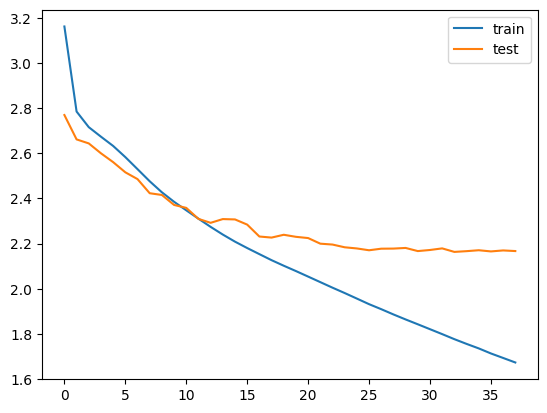

In [ ]:
# 22 aug
from matplotlib import pyplot
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

In [41]:
seq_Xtest = y_tokenizer.texts_to_sequences(list(X_test))
seq_ytest = y_tokenizer.texts_to_sequences(list(y_test))


seq_Xtest = pad_sequences(seq_Xtest,  maxlen=max_text_len, padding='post')
seq_ytest = pad_sequences(seq_ytest, maxlen=max_summary_len, padding='post')


model.evaluate(seq_Xtest,seq_ytest)

ValueError: ignored

In [42]:
src_word_index_reverse = tokenizer.index_word
target_word_index_reverse = y_tokenizer.index_word
target_word_index = y_tokenizer.word_index

target_word_index

{'sostoken': 1,
 'endtoken': 2,
 'great': 3,
 'good': 4,
 'the': 5,
 'not': 6,
 'for': 7,
 'best': 8,
 'and': 9,
 'my': 10,
 'love': 11,
 'it': 12,
 'tea': 13,
 'this': 14,
 'but': 15,
 'is': 16,
 'coffee': 17,
 'delicious': 18,
 'product': 19,
 'to': 20,
 'of': 21,
 'taste': 22,
 'very': 23,
 'dog': 24,
 'flavor': 25,
 'excellent': 26,
 'like': 27,
 'these': 28,
 'yummy': 29,
 'tasty': 30,
 'in': 31,
 'price': 32,
 'food': 33,
 'favorite': 34,
 'too': 35,
 'ever': 36,
 'you': 37,
 'so': 38,
 'are': 39,
 'loves': 40,
 'stuff': 41,
 'as': 42,
 'with': 43,
 'snack': 44,
 'dogs': 45,
 'on': 46,
 'them': 47,
 'awesome': 48,
 'just': 49,
 'better': 50,
 'chocolate': 51,
 'healthy': 52,
 'perfect': 53,
 'have': 54,
 'nice': 55,
 'free': 56,
 'yum': 57,
 'no': 58,
 'sweet': 59,
 'tastes': 60,
 'treat': 61,
 'what': 62,
 'than': 63,
 'wonderful': 64,
 'treats': 65,
 'quality': 66,
 'really': 67,
 'do': 68,
 'tasting': 69,
 'at': 70,
 'one': 71,
 'cat': 72,
 'bad': 73,
 'all': 74,
 'hot': 75,
 

We create a decoding function to summarise our test input.

In [43]:
def decode_sequence(input_seq):
    # Encode the input as state vectors.
    #print(input_seq)
    e_out, e_h, e_c = encoder_model.predict(input_seq)

    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1,1))

    # Chose the 'start' word as the first word of the target sequence
    target_seq[0, 0] = target_word_index['sostoken']

    stop_condition = False
    decoded_sentence = ''
    while not stop_condition:
        output_tokens, h, c = decoder_model.predict([target_seq] + [e_out, e_h, e_c], verbose=0)

        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])

        sampled_token = target_word_index_reverse[sampled_token_index]

        if(sampled_token!='endtoken'):
            decoded_sentence += ' '+sampled_token

            # Exit condition: either hit max length or find stop word.
        if (sampled_token == 'endtoken' or len(decoded_sentence.split()) >= (max_summary_len-1)):
            stop_condition = True


        # Update the target sequence (of length 1).
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index

        # Update internal states
        e_h, e_c = h, c

    return decoded_sentence

In [44]:
# encoder inference
encoder_model = Model(inputs=encoder_inputs,outputs=[encoder_outputs, state_h, state_c])

# decoder inference
# Below tensors will hold the states of the previous time step
decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_hidden_state_input = Input(shape=(max_text_len,latent_dim))

# Get the embeddings of the decoder sequence
dec_emb2 = Embedding(y_voc_size, embedding_dim, trainable=True)(decoder_inputs)
#decoder_embedding = Embedding(y_voc_size, embedding_dim, trainable=True)(decoder_inputs)


# To predict the next word in the sequence, set the initial states to the states from the previous time step
decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=[decoder_state_input_h, decoder_state_input_c])

#attention inference
attn_out_inf, attn_states_inf = attn([decoder_hidden_state_input, decoder_outputs2])
decoder_inf_concat = Concatenate(axis=-1, name='concat')([decoder_outputs2, attn_out_inf])

# A dense softmax layer to generate prob dist. over the target vocabulary
decoder_outputs2 = decoder_dense(decoder_inf_concat)

# Final decoder model
decoder_model = Model(
[decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c],
[decoder_outputs2] + [state_h2, state_c2])

In [45]:
def seq2summary(input_seq):
    newString=''
    for i in input_seq:
      if((i!=0 and i!=target_word_index['sostoken']) and i!=target_word_index['endtoken']):
        newString=newString+target_word_index_reverse[i]+' '
    return newString

def seq2text(input_seq):
    newString=''
    for i in input_seq:
      if(i!=0):
        newString=newString+src_word_index_reverse[i]+' '
    return newString

In [46]:
for i in range(0,100):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")

Review: ever since first having mcvitie digestives many many years ago i continue to maintain that they are the best nothing that compares to them in the states awesome to find these available through amazon i have bought digestives at whole foodsdifferent brand pretty expensive no comparison to the taste of mcvitie love them with goat cheese in the uk loved them with cranberry stilton awesome awesome awesome graham crackers no comparison you got to try them 
Original summary: mcvitie are the best 
1/1 [==============================] - 1s 934ms/step
Predicted summary:  and wheat and and and and and mix


Review: this is an excellent product especally for those of us who have to restrict the sodium intake 
Original summary: excellent product 
1/1 [==============================] - 0s 23ms/step
Predicted summary:  and and with with with and and alimenticias


Review: both of us really like these they are all nuts with a little syrup connecting them crunchy and very tasty great value at 

In [ ]:
# 22 aug
# incresae data size
for i in range(0,100):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")

Review: ever since first having mcvitie digestives many many years ago i continue to maintain that they are the best nothing that compares to them in the states awesome to find these available through amazon i have bought digestives at whole foodsdifferent brand pretty expensive no comparison to the taste of mcvitie love them with goat cheese in the uk loved them with cranberry stilton awesome awesome awesome graham crackers no comparison you got to try them 
Original summary: mcvitie are the best 
1/1 [==============================] - 1s 1s/step
Predicted summary:  chips chips chips to peanuts to ounce ounce


Review: this is an excellent product especally for those of us who have to restrict the sodium intake 
Original summary: excellent product 
1/1 [==============================] - 0s 30ms/step
Predicted summary:  to and to and to to and ounce


Review: both of us really like these they are all nuts with a little syrup connecting them crunchy and very tasty great value at amazon 

In [ ]:
model.save('lstm_new.keras')

In [ ]:
from google.colab import files
uploaded = files.upload()


KeyboardInterrupt: ignored

In [ ]:
new_model = tf.keras.models.load_model('lstm_new_model.keras')

In [ ]:
# incresae data size
for i in range(0,100):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")

Review: tried cook 6 different bags fraction product popped ones managed pop tasted overly salty unusual flavor unfortunately returnable rest going trash waste 
Original summary: horrid 
1/1 [==============================] - 0s 36ms/step
Predicted summary:  in but not not not not in ounce


Review: chocolates looked like melted cooled shape deformed chocolate stains box wrapper oily outside tried open disappointing 
Original summary: melted 
1/1 [==============================] - 0s 24ms/step
Predicted summary:  in melted and not in in in gummy


Review: recently bought 3 pack coffee bed bath beyond brewing smells great taste bad artificial taste many flavored coffees gave 3 stars terrible would buy coffee sensitive taste would recommend would grab dark roast throw fresh coconut instead want coconut coffee 
Original summary: bit disappointed 
1/1 [==============================] - 0s 29ms/step
Predicted summary:  but but and but and and and coffee


Review: absolutely delicious satisf

While LSTM (Long Short-Term Memory) encoder-decoder networks have been used successfully in various sequence-to-sequence tasks, they may not be the best choice for text summarization due to several limitations:

1. **Vanishing Gradient Problem**: LSTMs suffer from the vanishing gradient problem, especially when dealing with long sequences, like lengthy documents. This can lead to difficulties in capturing long-range dependencies, which are crucial for understanding the context in text summarization tasks.

2. **Limited Context Understanding**: LSTM encoders process input sequences sequentially, which means they have limited contextual information about the entire document. In text summarization, capturing global context is essential for generating coherent and informative summaries.

3. **Fixed-Length Context Vector**: LSTM encoders produce a fixed-length context vector that needs to encapsulate all the information from the input sequence. In complex summarization tasks, this fixed-length representation may struggle to capture all the relevant details effectively.

4. **Averaging of Information**: In LSTM-based encoder-decoder models, the encoder typically summarizes the input sequence into a single vector (context vector). However, this process may result in averaging out important information, leading to a loss of critical content during decoding.

5. **Exposure Bias**: During training, LSTM decoders are typically conditioned on the true target sequence (teacher forcing), which can lead to exposure bias. It means that the model is not exposed to its own errors during training, making it challenging to handle the discrepancies between the predicted and true outputs during inference.

Instead of LSTM encoder-decoder networks, more advanced architectures, such as the Transformer model, have shown better performance in text summarization tasks. Transformers address many of the limitations of LSTM-based models:

1. **Self-Attention Mechanism**: Transformers use self-attention, allowing them to capture long-range dependencies effectively and understand the entire context of the input sequence.

2. **Positional Encoding**: Transformers incorporate positional encoding to provide information about the order of words in the input sequence, ensuring that the model can process sequences without relying on their positional order.

3. **Multi-head Attention**: Transformers employ multi-head attention, enabling the model to focus on different parts of the input simultaneously and learn more informative representations.

4. **Encoder-Decoder Architecture**: Transformers use an encoder-decoder architecture with attention-based mechanisms in both the encoder and decoder, facilitating better alignment and coherence during summarization.

Overall, while LSTM encoder-decoder networks have their merits and can be suitable for some tasks, Transformers have proven to be more effective and powerful for text summarization, especially when dealing with long and complex documents.

In [ ]:
# dropout
for i in range(101,200):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")

Review: beagle vegetarian almost two years feed product pet guard vegetarian feast canned vegetarian dry never healthier coat never softer cruelty free us ever let anyone tell dog cannot vegetarian 
Original summary: yes dog vegetarian 
1/1 [==============================] - 1s 918ms/step
Predicted summary:  dog


Review: treats hit two med lg dogs buy small medium size dog treats though find size perfect would bit large smaller dog two enamored al say scooby doo come running one book 
Original summary: absolutely great treat 
1/1 [==============================] - 0s 21ms/step
Predicted summary:  dog


Review: like earl grey tea change black tea green tea pleasant scent taste find relaxing 
Original summary: tasty 
1/1 [==============================] - 0s 22ms/step
Predicted summary:  best


Review: came packed 4 plastic bags inside bubble envelope weight entire package unopened undamaged 14 2 ounces know china usa well short pound going bother trying get money back need aware 
Origi

In [ ]:
for i in range(101,200):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")

Review: beagle vegetarian almost two years feed product pet guard vegetarian feast canned vegetarian dry never healthier coat never softer cruelty free us ever let anyone tell dog cannot vegetarian 
Original summary: yes dog vegetarian 
1/1 [==============================] - 0s 65ms/step
Predicted summary:  food dog dog dog


Review: treats hit two med lg dogs buy small medium size dog treats though find size perfect would bit large smaller dog two enamored al say scooby doo come running one book 
Original summary: absolutely great treat 
1/1 [==============================] - 0s 58ms/step
Predicted summary:  dog dog dog dogs


Review: like earl grey tea change black tea green tea pleasant scent taste find relaxing 
Original summary: tasty 
1/1 [==============================] - 0s 33ms/step
Predicted summary:  green tea tea tea


Review: came packed 4 plastic bags inside bubble envelope weight entire package unopened undamaged 14 2 ounces know china usa well short pound going bother t

In [ ]:
print("Review:",seq2text(seq_Xtr[3452]))
print("Original summary:",seq2summary(seq_ytr[3452]))
print("Predicted summary:",decode_sequence(seq_Xtr[3452].reshape(1,max_text_len)))
print("\n")

Review: really enjoyed make soup vase sauce withouut adding meat favorit use base cook southern peas greens replaces fatty ham hocks 
Original summary: great soups 
1/1 [==============================] - 0s 25ms/step
Predicted summary:  gum angel hair bar




## Questions
1. Latent and Embedding dimensions can be of different values, but why do I sometimes get a dimension mismatch error?

2. Previous prediction output: "great, great, great coffee, great tea etc..." Possible reasons?



## TODO:
1. experiment with different parameters
2. vary dataset size
3. evaluation of lstm
4. start on bidirectional lstm

In [ ]:
!pip install rouge-score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=8b8e3c448a7e20a1eea1a5f1ae703e8d995db3ba6fd93616486e76135365b8e0
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score


In [ ]:
from rouge_score import rouge_scorer

In [ ]:
scorer = rouge_scorer.RougeScorer(['rouge1'], use_stemmer=True)

In [ ]:
candidate_summary = "the cat was found under the bed"
reference_summaries = ["the cat was under the bed", "found a cat under the bed"]
scores = {key: [] for key in ['rouge1', 'rouge2', 'rougeL']}
for ref in reference_summaries:
    temp_scores = scorer.score(ref, candidate_summary)
    for key in temp_scores:
        scores[key].append(temp_scores[key])

for key in scores:
    print(f'{key}:\n{scores[key]}')

In [ ]:
for i in range(0,100):
    print("Review:",seq2text(seq_Xtr[i]))
    print("Original summary:",seq2summary(seq_ytr[i]))
    print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    print("\n")
    candidate_summary = decode_sequence(seq_Xtr[i].reshape(1,max_text_len))
    reference_summary = seq2summary(seq_ytr[i])
    scores = {key: [] for key in ['rouge1']}
    #for ref in reference_summaries:
    temp_scores = scorer.score(reference_summary, candidate_summary)
   # print(temp_scores)
    for key in temp_scores:
        scores[key].append(temp_scores)

    for key in scores:
        print(f'{key}:\n{scores[key]}')



    # print("Review:",seq2text(seq_Xtr[i]))
    # print("Original summary:",seq2summary(seq_ytr[i]))
    # print("Predicted summary:",decode_sequence(seq_Xtr[i].reshape(1,max_text_len)))
    # print("\n")

Review: great item reveived tastes amazing love fact healthy helps get heachache hangover 
Original summary: great 
1/1 [==============================] - 0s 36ms/step
Predicted summary:  sugar coconut tastes bar


1/1 [==============================] - 0s 32ms/step
rouge1:
[{'rouge1': Score(precision=0.0, recall=0.0, fmeasure=0.0)}]
Review: would call chip connoisseur looking forward trying great chips 
Original summary: best jalapeno chips 
1/1 [==============================] - 0s 36ms/step
Predicted summary:  gluten gluten nut bar


1/1 [==============================] - 0s 21ms/step
rouge1:
[{'rouge1': Score(precision=0.0, recall=0.0, fmeasure=0.0)}]
Review: browsing around amazon looking gifts pleased see favorite sauce order shipped friends habanero favorite love heat tangy spiciness also love pineapple go wrong ordering 
Original summary: best sauce around 
1/1 [==============================] - 0s 24ms/step
Predicted summary:  chocolate hot hot chocolate


1/1 [===============

KeyboardInterrupt: ignored